# **From REST to reasoning: ingest, index, and query with dlt and Cognee.**

## **Taxi dataset example**

## **Let's install Cognee and Kuzu**

- [Cognee](https://www.cognee.ai/) is an open-source python library, connects data points and establishes ground truths to improve the accuracy of your AI agents and LLMs.
- [Kuzu](https://kuzudb.com/) is an open-source embedded, scalable, blazing fast graph database.

Read more about Cognee and Kuzu here: https://blog.kuzudb.com/post/cognee-kuzu-relational-data-to-knowledge-graph/

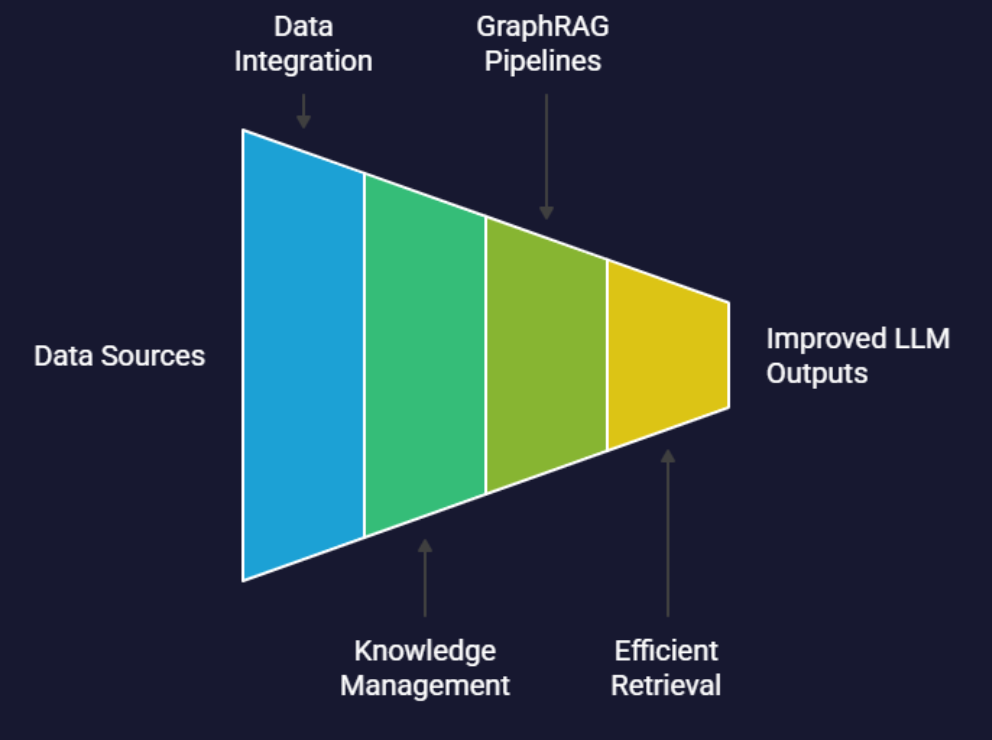

In [2]:
%%capture
!pip install cognee
!pip install kuzu

Before running Cognee you have to specify up your environment.

Cognee relies on third-party LLM providers and you have a [great choice of them](https://docs.cognee.ai/how-to-guides/remote-models) you can use in your workflow.

**The simple way**

Just provide your OpenAI API key if you already have one. This will help you both with LLM and embeddings.

In [3]:
import os
from dotenv import load_dotenv

load_dotenv()

True

In [4]:
os.environ["GRAPH_DATABASE_PROVIDER"] = "kuzu"
os.environ["LLM_API_KEY"] = str(os.getenv('GEMINI_API_KEY'))
os.environ["LLM_PROVIDER"] = "gemini"
os.environ["LLM_MODEL"]="gemini/gemini-1.5-flash"

os.environ['EMBEDDING_PROVIDER'] = "gemini"
os.environ['EMBEDDING_MODEL'] = "gemini/text-embedding-004"
os.environ['EMBEDDING_API_KEY'] =  os.getenv('GEMINI_API_KEY')

In [ ]:
os.environ["TOKEN_DEBUG_BLOCK"] = "do_not_print_secrets"

## **Data we'll be using**

In this example, we’ll request data from an API that serves the **NYC taxi dataset**. For these purposes we created an API that can serve the data you are already familiar with.

### **API documentation**:  
- **Data**: Comes in pages of 1,000 records.  
- **Pagination**: When there’s no more data, the API returns an empty page.  
- **Details**:  
  - **Method**: GET  
  - **URL**: `https://us-central1-dlthub-analytics.cloudfunctions.net/data_engineering_zoomcamp_api`  
  - **Parameters**:  
    - `page`: Integer (page number), defaults to 1.  

Here’s how we design our requester:  
1. **Request page by page** until we hit an empty page. Since we don’t know how much data is behind the API, we must assume it could be as little as 1,000 records or as much as 10GB.
2. **Use a generator** to handle this efficiently and avoid loading all data into memory.  

The dates for taxi rides are all from within June 2009.

## **We'll be partitioning our data in our own way**

1. first_10_days
2. second_10_days
3. last_10_days

We'll be doing this manually for clarity, but dlt also supports partitioning, as you can find [here](https://dlthub.com/docs/plus/ecosystem/iceberg#partitioning).

In [5]:
import dlt
import requests
import pandas as pd
from datetime import datetime

# Step 1: Create DLT resource
@dlt.resource(write_disposition="replace", name="zoomcamp_data")
def zoomcamp_data():
    url = "https://us-central1-dlthub-analytics.cloudfunctions.net/data_engineering_zoomcamp_api"
    response = requests.get(url)
    data = response.json()

    # Convert to DataFrame
    df = pd.DataFrame(data)
    df['Trip_Pickup_DateTime'] = pd.to_datetime(df['Trip_Pickup_DateTime'])

    # Define buckets
    df['tag'] = pd.cut(
        df['Trip_Pickup_DateTime'],
        bins=[
            pd.Timestamp("2009-06-01"),
            pd.Timestamp("2009-06-10"),
            pd.Timestamp("2009-06-20"),
            pd.Timestamp("2009-06-30")
        ],
        labels=["first_10_days", "second_10_days", "last_10_days"],
        right=False
    )

    # Drop rows not in the specified range
    df = df[df['tag'].notnull()]
    yield df


# Step 2: Create and run the pipeline
pipeline = dlt.pipeline(
    pipeline_name="zoomcamp_pipeline",
    destination="duckdb",
    dataset_name="zoomcamp_tagged_data"
)
load_info = pipeline.run(zoomcamp_data())
print(pipeline.last_trace)

2025-07-09 09:22:37,608|[WARNING]|15548|135219680690816|dlt|validate.py|verify_normalized_table:57|In schema `zoomcamp`: The following columns in table 'zoomcamp_data' did not receive any data during this load and therefore could not have their types inferred:
  - rate_code
  - mta_tax

Unless type hints are provided, these columns will not be materialized in the destination.
One way to provide type hints is to use the 'columns' argument in the '@dlt.resource' decorator.  For example:

@dlt.resource(columns={'rate_code': {'data_type': 'text'}})



Run started at 2025-07-09 09:22:33.513646+00:00 and COMPLETED in 5.09 seconds with 4 steps.
Step extract COMPLETED in 2.33 seconds.

Load package 1752052955.2750285 is EXTRACTED and NOT YET LOADED to the destination and contains no failed jobs

Step normalize COMPLETED in 0.03 seconds.
Normalized data for the following tables:
- zoomcamp_data: 998 row(s)

Load package 1752052955.2750285 is NORMALIZED and NOT YET LOADED to the destination and contains no failed jobs

Step load COMPLETED in 0.99 seconds.
Pipeline zoomcamp_pipeline load step completed in 0.11 seconds
1 load package(s) were loaded to destination duckdb and into dataset zoomcamp_tagged_data
The duckdb destination used duckdb:////workspaces/llm-zoomcamp/dlt-workshop/zoomcamp_pipeline.duckdb location to store data
Load package 1752052955.2750285 is LOADED and contains no failed jobs

Step run COMPLETED in 5.09 seconds.
Pipeline zoomcamp_pipeline load step completed in 0.11 seconds
1 load package(s) were loaded to destination 

In [6]:
dataset = pipeline.dataset().zoomcamp_data.df()

dataset

,end_lat,end_lon,fare_amt,passenger_count,payment_type,start_lat,start_lon,tip_amt,tolls_amt,total_amt,trip_distance,trip_dropoff_date_time,trip_pickup_date_time,store_and_forward,surcharge,vendor_name,tag
0,40.742963,-73.980072,45.0,1,Credit,40.641525,-73.787442,9.0,4.15,58.15,17.52,2009-06-14 23:48:00,2009-06-14 23:23:00,NaN,0.0,VTS,second_10_days
1,40.740187,-74.005698,6.5,1,Credit,40.722065,-74.009767,1.0,0.00,8.50,1.56,2009-06-18 17:43:00,2009-06-18 17:35:00,NaN,1.0,VTS,second_10_days
2,40.718043,-74.004745,12.5,5,Credit,40.761945,-73.983038,2.0,0.00,15.50,3.37,2009-06-10 18:27:00,2009-06-10 18:08:00,NaN,1.0,VTS,second_10_days
3,40.739637,-73.985233,4.9,1,CASH,40.749802,-73.992247,0.0,0.00,5.40,1.11,2009-06-14 23:58:00,2009-06-14 23:54:00,NaN,0.5,VTS,second_10_days
4,40.730032,-73.852693,25.7,1,CASH,40.776825,-73.949233,0.0,4.15,29.85,11.09,2009-06-13 13:23:00,2009-06-13 13:01:00,NaN,0.0,VTS,second_10_days
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
993,40.742998,-73.919065,6.9,1,CASH,40.743523,-73.918735,0.0,0.00,6.90,1.83,2009-06-10 06:23:00,2009-06-10 06:16:00,NaN,0.0,VTS,second_10_days
994,40.731953,-73.985330,7.3,1,CASH,40.733143,-74.006408,0.0,0.00,7.80,1.59,2009-06-10 05:11:00,2009-06-10 05:02:00,NaN,0.5,VTS,second_10_days
995,40.712640,-73.998870,5.7,1,CASH,40.711865,-74.010158,0.0,0.00,5.70,0.79,2009-06-13 12:45:00,2009-06-13 12:37:00,NaN,0.0,VTS,second_10_days
996,40.732998,-74.007113,7.3,2,CASH,40.744658,-73.992063,0.0,0.00,7.80,1.87,2009-06-09 21:34:00,2009-06-09 21:25:00,NaN,0.5,VTS,first_10_days


In [7]:
dataset["tag"].value_counts()

tag
first_10_days     481
second_10_days    295
last_10_days      222
Name: count, dtype: int64

## **Lets load data into Cognee!**

Here, I am using `cognee.add()` and then `cognee.cognify()` directly.

If you'd like to learn about how to use relational datasets in cognee, please visit the [docs](https://docs.cognee.ai/tutorials/load-your-relational-database) :)

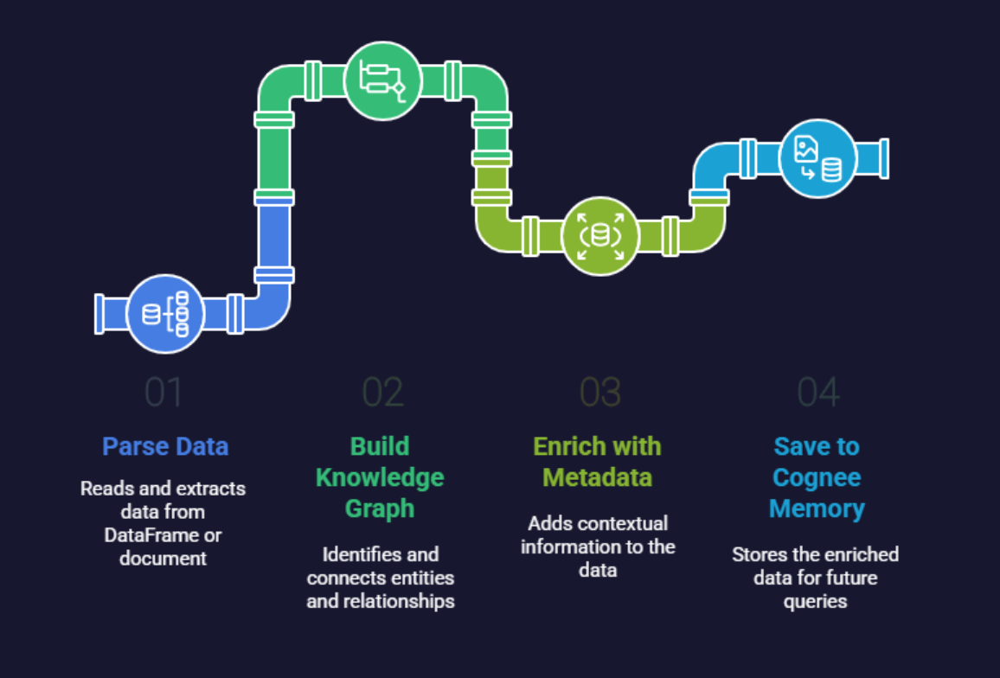

In [8]:
import cognee
from cognee.shared.logging_utils import get_logger, ERROR
from cognee.api.v1.visualize.visualize import visualize_graph
from cognee.api.v1.search import SearchType
from cognee.modules.engine.models import NodeSet
import os

async def main():
    await cognee.prune.prune_data()
    await cognee.prune.prune_system(metadata=True)

    # Add the first 10 days
    df_set1 = dataset.loc[dataset["tag"] == "first_10_days"]
    df_set1.drop(columns=["tag"], inplace=True)
    df_set1 = df_set1.to_json(orient="records", lines=False)
    await cognee.add(df_set1, node_set=["first_10_days"])

    # Add the second 10 days
    df_set2 = dataset.loc[dataset["tag"] == "second_10_days"]
    df_set2.drop(columns=["tag"], inplace=True)
    df_set2 = df_set2.to_json(orient="records", lines=False)
    await cognee.add(df_set2, node_set=["second_10_days"])

    # Add the last 10 days
    df_set3 = dataset.loc[dataset["tag"] == "last_10_days"]
    df_set3.drop(columns=["tag"], inplace=True)
    df_set3 = df_set3.to_json(orient="records", lines=False)
    await cognee.add(df_set3, node_set=["last_10_days"])

    await cognee.cognify()

    visualization_path = "/content/.artifacts/graph_visualization.html"
    await visualize_graph(visualization_path)


2025-07-09T09:22:38.827300 [info     ] Deleted old log file: /usr/local/python/3.12.1/lib/python3.12/site-packages/logs/2025-07-07_10-33-15.log [cognee.shared.logging_utils]

2025-07-09T09:22:38.828174 [info     ] Logging initialized            [cognee.shared.logging_utils] cognee_version=0.2.0 os_info='Linux 6.8.0-1027-azure (#32~22.04.1-Ubuntu SMP Thu Apr  3 20:26:27 UTC 2025)' python_version=3.12.1 structlog_version=25.4.0

2025-07-09T09:22:38.829138 [info     ] Want to learn more? Visit the Cognee documentation: https://docs.cognee.ai [cognee.shared.logging_utils]

HTTP Request: GET https://raw.githubusercontent.com/BerriAI/litellm/main/model_prices_and_context_window.json "HTTP/1.1 200 OK"
/usr/local/python/3.12.1/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Run the `main()` function. It might take some time, so go ahead and grab a cup of coffee. 🫖

In [9]:
await main()


2025-07-09T09:23:06.552954 [info     ] Cleared all data from graph while preserving structure [cognee.shared.logging_utils]
2025-07-09T09:23:06.570255 [info     ] Deleted Kuzu database files at /usr/local/python/3.12.1/lib/python3.12/site-packages/cognee/.cognee_system/databases/cognee_graph_kuzu [cognee.shared.logging_utils]
2025-07-09T09:23:09.829026 [info     ] Database deleted successfully. [cognee.shared.logging_utils]/tmp/ipykernel_15548/94887109.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_set1.drop(columns=["tag"], inplace=True)

Langfuse client is disabled since no public_key was provided as a parameter or environment variable 'LANGFUSE_PUBLIC_KEY'. See our docs: https://langfuse.com/docs/sdk/python/low-level-sdk#initialize-client09:23:10 - LiteLLM:INFO: utils.py:2929 - 
LiteLLM co

User d7550a91-3d76-474f-a174-9d9e7c866ee1 has registered.



2025-07-09T09:23:12.480336 [info     ] Coroutine task started: `resolve_data_directories` [run_tasks_base]
2025-07-09T09:23:12.622965 [info     ] Coroutine task started: `ingest_data` [run_tasks_base]
2025-07-09T09:23:13.245077 [info     ] Coroutine task completed: `ingest_data` [run_tasks_base]
2025-07-09T09:23:13.370716 [info     ] Coroutine task completed: `resolve_data_directories` [run_tasks_base]
2025-07-09T09:23:13.496566 [info     ] Pipeline run completed: `b39ac4ac-a39e-5837-9d36-659b0caec9f8` [run_tasks(tasks: [Task], data)]/tmp/ipykernel_15548/94887109.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_set2.drop(columns=["tag"], inplace=True)

2025-07-09T09:23:13.682117 [info     ] Pipeline run started: `b39ac4ac-a39e-5837-9d36-659b0caec9f8` [run_tasks(tasks: [Task], data)]
2025-07-09T


Give Feedback / Get Help: https://github.com/BerriAI/litellm/issues/new
LiteLLM.Info: If you need to debug this error, use `litellm._turn_on_debug()'.



10:09:38 - LiteLLM:INFO: utils.py:2929 - 
LiteLLM completion() model= gemini-1.5-flash; provider = gemini

LiteLLM completion() model= gemini-1.5-flash; provider = gemini10:09:38 - LiteLLM:INFO: utils.py:2929 - 
LiteLLM completion() model= gemini-1.5-flash; provider = gemini

LiteLLM completion() model= gemini-1.5-flash; provider = gemini


Give Feedback / Get Help: https://github.com/BerriAI/litellm/issues/new
LiteLLM.Info: If you need to debug this error, use `litellm._turn_on_debug()'.



10:09:40 - LiteLLM:INFO: utils.py:2929 - 
LiteLLM completion() model= gemini-1.5-flash; provider = gemini

LiteLLM completion() model= gemini-1.5-flash; provider = gemini


Give Feedback / Get Help: https://github.com/BerriAI/litellm/issues/new
LiteLLM.Info: If you need to debug this error, use `litellm._turn_on_debug()'.



╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ /usr/local/python/3.12.1/lib/python3.12/site-packages/cognee/modules/pipelines/operations/run_ta │
│ sks_base.py:39 in handle_task                                                                    │
│                                                                                                  │
│   36 │   │   args.append(context)                                                                │
│   37 │                                                                                           │
│   38 │   try:                                                                                    │
│ ❱ 39 │   │   async for result_data in running_task.execute(args, next_task_batch_size):          │
│   40 │   │   │   async for result in run_tasks_base(leftover_tasks, result_data, user, contex    │
│   41 │   │   │   │   yield result                                                                │
│   42                                                                                             │
│                                                                                                  │
│ ╭─────────────────────────────────────────── locals ───────────────────────────────────────────╮ │
│ │                 args = [                                                                     │ │
│ │                        │   [                                                                 │ │
│ │                        │   │   DocumentChunk(                                                │ │
│ │                        │   │   │   id=UUID('7bb932b8-f604-57cc-adfd-f348c68171cd'),          │ │
│ │                        │   │   │   created_at=1752053633876,                                 │ │
│ │                        │   │   │   updated_at=1752053633876,                                 │ │
│ │                        │   │   │   ontology_valid=False,                                     │ │
│ │                        │   │   │   version=1,                                                │ │
│ │                        │   │   │   topological_rank=0,                                       │ │
│ │                        │   │   │   metadata={'index_fields': ['text']},                      │ │
│ │                        │   │   │   type='DocumentChunk',                                     │ │
│ │                        │   │   │   belongs_to_set=[                                          │ │
│ │                        │   │   │   │   NodeSet(                                              │ │
│ │                        │   │   │   │   │   id=UUID('18c3f1ca-e823-5938-bda9-776b93bff3b0'),  │ │
│ │                        │   │   │   │   │   created_at=1752052995797,                         │ │
│ │                        │   │   │   │   │   updated_at=1752052995797,                         │ │
│ │                        │   │   │   │   │   ontology_valid=False,                             │ │
│ │                        │   │   │   │   │   version=1,                                        │ │
│ │                        │   │   │   │   │   topological_rank=0,                               │ │
│ │                        │   │   │   │   │   metadata={'index_fields': []},                    │ │
│ │                        │   │   │   │   │   type='NodeSet',                                   │ │
│ │                        │   │   │   │   │   belongs_to_set=None,                              │ │
│ │                        │   │   │   │   │   name='last_10_days'                               │ │
│ │                        │   │   │   │   )                                                     │ │
│ │                        │   │   │   ],                                                        │ │
│ │                        │   │   │                                                             │ │
│ │                        text='[{"end_lat":40.828803,"end_l


2025-07-09T10:11:03.773108 [error    ] Coroutine task errored: `extract_graph_from_data`
1 validation error for KnowledgeGraph
  Invalid JSON: EOF while parsing a string at line 1 column 22561 [type=json_invalid, input_value='{"summary": "Trip record...208", "name": "Trip 208', input_type=str]
    For further information visit https://errors.pydantic.dev/2.10/v/json_invalid
 [run_tasks_base] exception_message='1 validation error for KnowledgeGraph\n  Invalid JSON: EOF while parsing a string at line 1 column 22561 [type=json_invalid, input_value=\'{"summary": "Trip record...208", "name": "Trip 208\', input_type=str]\n    For further information visit https://errors.pydantic.dev/2.10/v/json_invalid' traceback=True


╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ /usr/local/python/3.12.1/lib/python3.12/site-packages/cognee/modules/pipelines/operations/run_ta │
│ sks_base.py:40 in handle_task                                                                    │
│                                                                                                  │
│   37 │                                                                                           │
│   38 │   try:                                                                                    │
│   39 │   │   async for result_data in running_task.execute(args, next_task_batch_size):          │
│ ❱ 40 │   │   │   async for result in run_tasks_base(leftover_tasks, result_data, user, contex    │
│   41 │   │   │   │   yield result                                                                │
│   42 │   │                                                                                       │
│   43 │   │   logger.info(f"{task_type} task completed: `{running_task.executable.__name__}`")    │
│                                                                                                  │
│ ╭─────────────────────────────────────────── locals ───────────────────────────────────────────╮ │
│ │                 args = [                                                                     │ │
│ │                        │   [                                                                 │ │
│ │                        │   │   TextDocument(                                                 │ │
│ │                        │   │   │   id=UUID('120674f0-4e2f-5f8d-9648-9e546be22e0f'),          │ │
│ │                        │   │   │   created_at=1752052995797,                                 │ │
│ │                        │   │   │   updated_at=1752052995797,                                 │ │
│ │                        │   │   │   ontology_valid=False,                                     │ │
│ │                        │   │   │   version=1,                                                │ │
│ │                        │   │   │   topological_rank=0,                                       │ │
│ │                        │   │   │   metadata={'index_fields': ['name']},                      │ │
│ │                        │   │   │   type='TextDocument',                                      │ │
│ │                        │   │   │   belongs_to_set=[                                          │ │
│ │                        │   │   │   │   NodeSet(                                              │ │
│ │                        │   │   │   │   │   id=UUID('18c3f1ca-e823-5938-bda9-776b93bff3b0'),  │ │
│ │                        │   │   │   │   │   created_at=1752052995797,                         │ │
│ │                        │   │   │   │   │   updated_at=1752052995797,                         │ │
│ │                        │   │   │   │   │   ontology_valid=False,                             │ │
│ │                        │   │   │   │   │   version=1,                                        │ │
│ │                        │   │   │   │   │   topological_rank=0,                               │ │
│ │                        │   │   │   │   │   metadata={'index_fields': []},                    │ │
│ │                        │   │   │   │   │   type='NodeSet',                                   │ │
│ │                        │   │   │   │   │   belongs_to_set=None,                              │ │
│ │                        │   │   │   │   │   name='last_10_days'                               │ │
│ │                        │   │   │   │   )                                                     │ │
│ │                        │   │   │   ],                                                        │ │
│ │                        │   │   │   name='text_0ab6f32b8892bf079db1ed2404111896',             │ │
│ │                        │   │   │                         


2025-07-09T10:11:04.433367 [error    ] Async Generator task errored: `extract_chunks_from_documents`
1 validation error for KnowledgeGraph
  Invalid JSON: EOF while parsing a string at line 1 column 22561 [type=json_invalid, input_value='{"summary": "Trip record...208", "name": "Trip 208', input_type=str]
    For further information visit https://errors.pydantic.dev/2.10/v/json_invalid
 [run_tasks_base] exception_message='1 validation error for KnowledgeGraph\n  Invalid JSON: EOF while parsing a string at line 1 column 22561 [type=json_invalid, input_value=\'{"summary": "Trip record...208", "name": "Trip 208\', input_type=str]\n    For further information visit https://errors.pydantic.dev/2.10/v/json_invalid' traceback=True


╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ /usr/local/python/3.12.1/lib/python3.12/site-packages/cognee/modules/pipelines/operations/run_ta │
│ sks_base.py:40 in handle_task                                                                    │
│                                                                                                  │
│   37 │                                                                                           │
│   38 │   try:                                                                                    │
│   39 │   │   async for result_data in running_task.execute(args, next_task_batch_size):          │
│ ❱ 40 │   │   │   async for result in run_tasks_base(leftover_tasks, result_data, user, contex    │
│   41 │   │   │   │   yield result                                                                │
│   42 │   │                                                                                       │
│   43 │   │   logger.info(f"{task_type} task completed: `{running_task.executable.__name__}`")    │
│                                                                                                  │
│ ╭─────────────────────────────────────────── locals ───────────────────────────────────────────╮ │
│ │                 args = [                                                                     │ │
│ │                        │   [                                                                 │ │
│ │                        │   │   TextDocument(                                                 │ │
│ │                        │   │   │   id=UUID('120674f0-4e2f-5f8d-9648-9e546be22e0f'),          │ │
│ │                        │   │   │   created_at=1752052995797,                                 │ │
│ │                        │   │   │   updated_at=1752052995797,                                 │ │
│ │                        │   │   │   ontology_valid=False,                                     │ │
│ │                        │   │   │   version=1,                                                │ │
│ │                        │   │   │   topological_rank=0,                                       │ │
│ │                        │   │   │   metadata={'index_fields': ['name']},                      │ │
│ │                        │   │   │   type='TextDocument',                                      │ │
│ │                        │   │   │   belongs_to_set=[                                          │ │
│ │                        │   │   │   │   NodeSet(                                              │ │
│ │                        │   │   │   │   │   id=UUID('18c3f1ca-e823-5938-bda9-776b93bff3b0'),  │ │
│ │                        │   │   │   │   │   created_at=1752052995797,                         │ │
│ │                        │   │   │   │   │   updated_at=1752052995797,                         │ │
│ │                        │   │   │   │   │   ontology_valid=False,                             │ │
│ │                        │   │   │   │   │   version=1,                                        │ │
│ │                        │   │   │   │   │   topological_rank=0,                               │ │
│ │                        │   │   │   │   │   metadata={'index_fields': []},                    │ │
│ │                        │   │   │   │   │   type='NodeSet',                                   │ │
│ │                        │   │   │   │   │   belongs_to_set=None,                              │ │
│ │                        │   │   │   │   │   name='last_10_days'                               │ │
│ │                        │   │   │   │   )                                                     │ │
│ │                        │   │   │   ],                                                        │ │
│ │                        │   │   │   name='text_0ab6f32b8892bf079db1ed2404111896',             │ │
│ │                        │   │   │                         


2025-07-09T10:11:05.352264 [error    ] Coroutine task errored: `check_permissions_on_dataset`
1 validation error for KnowledgeGraph
  Invalid JSON: EOF while parsing a string at line 1 column 22561 [type=json_invalid, input_value='{"summary": "Trip record...208", "name": "Trip 208', input_type=str]
    For further information visit https://errors.pydantic.dev/2.10/v/json_invalid
 [run_tasks_base] exception_message='1 validation error for KnowledgeGraph\n  Invalid JSON: EOF while parsing a string at line 1 column 22561 [type=json_invalid, input_value=\'{"summary": "Trip record...208", "name": "Trip 208\', input_type=str]\n    For further information visit https://errors.pydantic.dev/2.10/v/json_invalid' traceback=True


╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ /usr/local/python/3.12.1/lib/python3.12/site-packages/cognee/modules/pipelines/operations/run_ta │
│ sks_base.py:40 in handle_task                                                                    │
│                                                                                                  │
│   37 │                                                                                           │
│   38 │   try:                                                                                    │
│   39 │   │   async for result_data in running_task.execute(args, next_task_batch_size):          │
│ ❱ 40 │   │   │   async for result in run_tasks_base(leftover_tasks, result_data, user, contex    │
│   41 │   │   │   │   yield result                                                                │
│   42 │   │                                                                                       │
│   43 │   │   logger.info(f"{task_type} task completed: `{running_task.executable.__name__}`")    │
│                                                                                                  │
│ ╭─────────────────────────────────────────── locals ───────────────────────────────────────────╮ │
│ │                 args = [                                                                     │ │
│ │                        │   [                                                                 │ │
│ │                        │   │   <cognee.modules.data.models.Data.Data object at               │ │
│ │                        0x7afacb0e5be0>,                                                      │ │
│ │                        │   │   <cognee.modules.data.models.Data.Data object at               │ │
│ │                        0x7afacb0e5ca0>,                                                      │ │
│ │                        │   │   <cognee.modules.data.models.Data.Data object at               │ │
│ │                        0x7afacb0e5df0>                                                       │ │
│ │                        │   ]                                                                 │ │
│ │                        ]                                                                     │ │
│ │              context = {                                                                     │ │
│ │                        │   'dataset': <cognee.modules.data.models.Dataset.Dataset object at  │ │
│ │                        0x7afacb0e7ce0>                                                       │ │
│ │                        }                                                                     │ │
│ │                error = 1 validation error for KnowledgeGraph                                 │ │
│ │                          Invalid JSON: EOF while parsing a string at line 1 column 22561     │ │
│ │                        [type=json_invalid, input_value='{"summary": "Trip record...208",     │ │
│ │                        "name": "Trip 208', input_type=str]                                   │ │
│ │                        │   For further information visit                                     │ │
│ │                        https://errors.pydantic.dev/2.10/v/json_invalid                       │ │
│ │          has_context = False                                                                 │ │
│ │       leftover_tasks = [                                                                     │ │
│ │                        │   <cognee.modules.pipelines.tasks.task.Task object at               │ │
│ │                        0x7afacb08ad50>,                                                      │ │
│ │                        │   <cognee.modules.pipelines.tasks.task.Task object at               │ │
│ │                        0x7afacb10e330>,                                                      │ │
│ │                        │   <cognee.modules.pipelines.task


2025-07-09T10:11:06.880235 [error    ] Coroutine task errored: `classify_documents`
1 validation error for KnowledgeGraph
  Invalid JSON: EOF while parsing a string at line 1 column 22561 [type=json_invalid, input_value='{"summary": "Trip record...208", "name": "Trip 208', input_type=str]
    For further information visit https://errors.pydantic.dev/2.10/v/json_invalid
 [run_tasks_base] exception_message='1 validation error for KnowledgeGraph\n  Invalid JSON: EOF while parsing a string at line 1 column 22561 [type=json_invalid, input_value=\'{"summary": "Trip record...208", "name": "Trip 208\', input_type=str]\n    For further information visit https://errors.pydantic.dev/2.10/v/json_invalid' traceback=True


╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ /usr/local/python/3.12.1/lib/python3.12/site-packages/cognee/modules/pipelines/operations/run_ta │
│ sks.py:49 in run_tasks_with_telemetry                                                            │
│                                                                                                  │
│    46 │   │   │   | config,                                                                      │
│    47 │   │   )                                                                                  │
│    48 │   │                                                                                      │
│ ❱  49 │   │   async for result in run_tasks_base(tasks, data, user, context):                    │
│    50 │   │   │   yield result                                                                   │
│    51 │   │                                                                                      │
│    52 │   │   logger.info("Pipeline run completed: `%s`", pipeline_name)                         │
│                                                                                                  │
│ ╭─────────────────────────────────────────── locals ───────────────────────────────────────────╮ │
│ │        config = {                                                                            │ │
│ │                 │   'llm': {'provider': 'gemini', 'model': 'gemini/gemini-1.5-flash'},       │ │
│ │                 │   'graph': {                                                               │ │
│ │                 │   │   'provider': 'kuzu',                                                  │ │
│ │                 │   │   'url':                                                               │ │
│ │                 '/usr/local/python/3.12.1/lib/python3.12/site-packages/cognee/.cognee_syste… │ │
│ │                 │   },                                                                       │ │
│ │                 │   'vector': {                                                              │ │
│ │                 │   │   'provider': 'lancedb',                                               │ │
│ │                 │   │   'url':                                                               │ │
│ │                 '/usr/local/python/3.12.1/lib/python3.12/site-packages/cognee/.cognee_syste… │ │
│ │                 │   },                                                                       │ │
│ │                 │   'relational': {                                                          │ │
│ │                 │   │   'provider': 'sqlite',                                                │ │
│ │                 │   │   'url':                                                               │ │
│ │                 '/usr/local/python/3.12.1/lib/python3.12/site-packages/cognee/.cognee_syste… │ │
│ │                 │   }                                                                        │ │
│ │                 }                                                                            │ │
│ │       context = {                                                                            │ │
│ │                 │   'dataset': <cognee.modules.data.models.Dataset.Dataset object at         │ │
│ │                 0x7afacb0e7ce0>                                                              │ │
│ │                 }                                                                            │ │
│ │          data = [                                                                            │ │
│ │                 │   <cognee.modules.data.models.Data.Data object at 0x7afacb0e5be0>,         │ │
│ │                 │   <cognee.modules.data.models.Data.Data object at 0x7afacb0e5ca0>,         │ │
│ │                 │   <cognee.modules.data.models.Data.Data object at 0x7afacb0e5df0>          │ │
│ │                 ]                                        


2025-07-09T10:11:08.508131 [error    ] Pipeline run errored: `d6e5a1a3-2abc-5cc7-89c6-ae296bd190c9`
1 validation error for KnowledgeGraph
  Invalid JSON: EOF while parsing a string at line 1 column 22561 [type=json_invalid, input_value='{"summary": "Trip record...208", "name": "Trip 208', input_type=str]
    For further information visit https://errors.pydantic.dev/2.10/v/json_invalid
 [run_tasks(tasks: [Task], data)] exception_message='1 validation error for KnowledgeGraph\n  Invalid JSON: EOF while parsing a string at line 1 column 22561 [type=json_invalid, input_value=\'{"summary": "Trip record...208", "name": "Trip 208\', input_type=str]\n    For further information visit https://errors.pydantic.dev/2.10/v/json_invalid' traceback=True


ValidationError: 1 validation error for KnowledgeGraph
  Invalid JSON: EOF while parsing a string at line 1 column 22561 [type=json_invalid, input_value='{"summary": "Trip record...208", "name": "Trip 208', input_type=str]
    For further information visit https://errors.pydantic.dev/2.10/v/json_invalid

### **Look at the knowledge graph**



In [15]:
import webbrowser

webbrowser.open("/content/.artifacts/graph_visualization.html")

Unable to connect to VS Code server: Error in request.
Error: connect ENOENT /tmp/vscode-ipc-39f88bb4-796d-4f8b-bce6-852247f84dd0.sock
    at PipeConnectWrap.afterConnect [as oncomplete] (node:net:1636:16) {
  errno: -2,
  code: 'ENOENT',
  syscall: 'connect',
  address: '/tmp/vscode-ipc-39f88bb4-796d-4f8b-bce6-852247f84dd0.sock'
}


Alert!: Unable to access document.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                      

False

In [16]:
import os
print(os.getcwd())
os.listdir(".artifacts")


/workspaces/llm-zoomcamp/dlt-workshop


FileNotFoundError: [Errno 2] No such file or directory: '.artifacts'

## **Search**

In [12]:
async def search_cognee(query, node_set, query_type=SearchType.GRAPH_COMPLETION):
    answer = await cognee.search(
        query_text=query,
        query_type=query_type,
        node_type=NodeSet,
        node_name=node_set,
        top_k=5 # limit search for retrieval
    )
    return answer

In [13]:
results = await search_cognee(
    "What's in this knowledge graph?",
    node_set=["first_10_days"]
)


2025-07-09T10:43:24.059990 [error    ] EntityNotFoundError: Nodeset does not exist, or empty nodetes projected from the database. (Status code: 404) [cognee.shared.logging_utils]10:43:24 - LiteLLM:INFO: cost_calculator.py:655 - selected model name for cost calculation: gemini/text-embedding-004
selected model name for cost calculation: gemini/text-embedding-00410:43:24 - LiteLLM:INFO: cost_calculator.py:655 - selected model name for cost calculation: gemini/text-embedding-004
selected model name for cost calculation: gemini/text-embedding-00410:43:24 - LiteLLM:INFO: cost_calculator.py:655 - selected model name for cost calculation: gemini/text-embedding-004
selected model name for cost calculation: gemini/text-embedding-00410:43:24 - LiteLLM:INFO: cost_calculator.py:655 - selected model name for cost calculation: gemini/text-embedding-004
selected model name for cost calculation: gemini/text-embedding-00410:43:24 - LiteLLM:INFO: cost_calculator.py:655 - selected model name for cost ca


Give Feedback / Get Help: https://github.com/BerriAI/litellm/issues/new
LiteLLM.Info: If you need to debug this error, use `litellm._turn_on_debug()'.



In [14]:
print(results[0])

The provided text does not contain a knowledge graph.  Therefore, I cannot answer what's in it.

